# Pump it Up: Data Mining the Water Table

Using data from Taarifa and the Tanzanian Ministry of Water, can you predict which pumps are functional, which need some repairs, and which don't work at all? This is an intermediate-level practice competition. Predict one of these three classes based on a number of variables about what kind of pump is operating, when it was installed, and how it is managed. A smart understanding of which waterpoints will fail can improve maintenance operations and ensure that clean, potable water is available to communities across Tanzania.



Your goal is to predict the operating condition of a waterpoint for each record in the dataset. You are provided the following set of information about the waterpoints:

amount_tsh - Total static head (amount water available to waterpoint)

date_recorded - The date the row was entered

funder - Who funded the well

gps_height - Altitude of the well

installer - Organization that installed the well

longitude - GPS coordinate

latitude - GPS coordinate

wpt_name - Name of the waterpoint if there is one

num_private -

basin - Geographic water basin

subvillage - Geographic location

region - Geographic location

region_code - Geographic location (coded)

district_code - Geographic location (coded)

lga - Geographic location

ward - Geographic location

population - Population around the well

public_meeting - True/False

recorded_by - Group entering this row of data

scheme_management - Who operates the waterpoint

scheme_name - Who operates the waterpoint

permit - If the waterpoint is permitted

construction_year - Year the waterpoint was constructed

extraction_type - The kind of extraction the waterpoint uses

extraction_type_group - The kind of extraction the waterpoint uses

extraction_type_class - The kind of extraction the waterpoint uses

management - How the waterpoint is managed

management_group - How the waterpoint is managed

payment - What the water costs

payment_type - What the water costs

water_quality - The quality of the water

quality_group - The quality of the water

quantity - The quantity of water

quantity_group - The quantity of water

source - The source of the water

source_type - The source of the water

source_class - The source of the water

waterpoint_type - The kind of waterpoint

waterpoint_type_group - The kind of waterpoint

## Importing the necessary libraries

In [1]:
# Importing the necessary libraries
import numpy as np
import pandas as pd
import pandas_profiling as pp
import matplotlib.pyplot as plt
import seaborn as sns



# Model development libraries
from sklearn.linear_model import BayesianRidge
from fancyimpute import IterativeImputer as MICE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from catboost import CatBoostClassifier


from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

%matplotlib inline

Using TensorFlow backend.


## Getting the data

In [2]:
pump_values = pd.read_csv('Training Set Values.csv')

pump_labels = pd.read_csv('Training Set Labels.csv')

In [3]:
#Enables us to view all the columns
pd.set_option('display.max_columns',40)

In [4]:
pump_values.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe


In [5]:
pump_labels.head()

,id,status_group
0,69572,functional
1,8776,functional
2,34310,functional
3,67743,non functional
4,19728,functional


In [6]:
#Joining the datasets
pump = pd.concat((pump_values, pump_labels['status_group']), axis =1)

In [7]:
pump.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,...,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,...,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,...,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,...,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,...,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,...,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


## Exploralatory Data Analysis

This involves understanding the data, drawing insights from the data, cleaning and tidying it

In [8]:
pump.describe(include = 'all')

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,...,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
count,59400.000000,59400.000000,59400,55765,59400.000000,55745,59400.000000,5.940000e+04,59400,59400.000000,59400,59029,59400,59400.000000,59400.000000,59400,59400,59400.000000,56066,59400,...,31234,56344,59400.000000,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400
unique,NaN,NaN,356,1897,NaN,2145,NaN,NaN,37400,NaN,9,19287,21,NaN,NaN,125,2092,NaN,2,1,...,2696,2,NaN,18,13,7,12,5,7,7,8,6,5,5,10,7,3,7,6,3
top,NaN,NaN,2011-03-15,Government Of Tanzania,NaN,DWE,NaN,NaN,none,NaN,Lake Victoria,Madukani,Iringa,NaN,NaN,Njombe,Igosi,NaN,True,GeoData Consultants Ltd,...,K,True,NaN,gravity,gravity,gravity,vwc,user-group,never pay,never pay,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
freq,NaN,NaN,572,9084,NaN,17402,NaN,NaN,3563,NaN,10248,508,5294,NaN,NaN,2503,307,NaN,51011,59400,...,682,38852,NaN,26780,26780,26780,40507,52490,25348,25348,50818,50818,33186,33186,17021,17021,45794,28522,34625,32259
mean,37115.131768,317.650385,NaN,NaN,668.297239,NaN,34.077427,-5.706033e+00,NaN,0.474141,NaN,NaN,NaN,15.297003,5.629747,NaN,NaN,179.909983,NaN,NaN,...,NaN,NaN,1300.652475,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,21453.128371,2997.574558,NaN,NaN,693.116350,NaN,6.567432,2.946019e+00,NaN,12.236230,NaN,NaN,NaN,17.587406,9.633649,NaN,NaN,471.482176,NaN,NaN,...,NaN,NaN,951.620547,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,0.000000,0.000000,NaN,NaN,-90.000000,NaN,0.000000,-1.164944e+01,NaN,0.000000,NaN,NaN,NaN,1.000000,0.000000,NaN,NaN,0.000000,NaN,NaN,...,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,18519.750000,0.000000,NaN,NaN,0.000000,NaN,33.090347,-8.540621e+00,NaN,0.000000,NaN,NaN,NaN,5.000000,2.000000,NaN,NaN,0.000000,NaN,NaN,...,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,37061.500000,0.000000,NaN,NaN,369.000000,NaN,34.908743,-5.021597e+00,NaN,0.000000,NaN,NaN,NaN,12.000000,3.000000,NaN,NaN,25.000000,NaN,NaN,...,NaN,NaN,1986.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,55656.500000,20.000000,NaN,NaN,1319.250000,NaN,37.178387,-3.326156e+00,NaN,0.000000,NaN,NaN,NaN,17.000000,5.000000,NaN,NaN,215.000000,NaN,NaN,...,NaN,NaN,2004.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
pump.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 41 columns):
id                       59400 non-null int64
amount_tsh               59400 non-null float64
date_recorded            59400 non-null object
funder                   55765 non-null object
gps_height               59400 non-null int64
installer                55745 non-null object
longitude                59400 non-null float64
latitude                 59400 non-null float64
wpt_name                 59400 non-null object
num_private              59400 non-null int64
basin                    59400 non-null object
subvillage               59029 non-null object
region                   59400 non-null object
region_code              59400 non-null int64
district_code            59400 non-null int64
lga                      59400 non-null object
ward                     59400 non-null object
population               59400 non-null int64
public_meeting           56066 non-null object
r

In [10]:
# Changing the data type of the two columns to datetime
pump['date_recorded'] = pd.to_datetime(pump['date_recorded'])

pump['construction_year'] = pd.to_datetime(pump['construction_year'])

In [11]:
pump.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 41 columns):
id                       59400 non-null int64
amount_tsh               59400 non-null float64
date_recorded            59400 non-null datetime64[ns]
funder                   55765 non-null object
gps_height               59400 non-null int64
installer                55745 non-null object
longitude                59400 non-null float64
latitude                 59400 non-null float64
wpt_name                 59400 non-null object
num_private              59400 non-null int64
basin                    59400 non-null object
subvillage               59029 non-null object
region                   59400 non-null object
region_code              59400 non-null int64
district_code            59400 non-null int64
lga                      59400 non-null object
ward                     59400 non-null object
population               59400 non-null int64
public_meeting           56066 non-null 

In [12]:
pump['status_group'].value_counts(normalize = True)*100

functional                 54.308081
non functional             38.424242
functional needs repair     7.267677
Name: status_group, dtype: float64

The multiclass is abit imbalanced, hence we will have to deal with that

In [13]:
pp.ProfileReport(pump)

## Cleaning Data

https://towardsdatascience.com/the-ultimate-guide-to-data-cleaning-3969843991d4

https://elitedatascience.com/data-cleaning

https://www.kaggle.com/kashnitsky/topic-1-exploratory-data-analysis-with-pandas

https://www.kaggle.com/rtatman/data-cleaning-challenge-handling-missing-values

https://medium.com/@swethalakshmanan14/how-when-and-why-should-you-normalize-standardize-rescale-your-data-3f083def38ff

https://www.kaggle.com/pavansanagapati/simple-tutorial-how-to-handle-missing-data

### Highly Correlated data

Here, we will delete some of the columns that are alike to each other.

https://datascience.stackexchange.com/questions/24452/in-supervised-learning-why-is-it-bad-to-have-correlated-features

In [14]:
pump.columns

Index(['id', 'amount_tsh', 'date_recorded', 'funder', 'gps_height',
       'installer', 'longitude', 'latitude', 'wpt_name', 'num_private',
       'basin', 'subvillage', 'region', 'region_code', 'district_code', 'lga',
       'ward', 'population', 'public_meeting', 'recorded_by',
       'scheme_management', 'scheme_name', 'permit', 'construction_year',
       'extraction_type', 'extraction_type_group', 'extraction_type_class',
       'management', 'management_group', 'payment', 'payment_type',
       'water_quality', 'quality_group', 'quantity', 'quantity_group',
       'source', 'source_type', 'source_class', 'waterpoint_type',
       'waterpoint_type_group', 'status_group'],
      dtype='object')

In [15]:
pump.drop(['extraction_type_group', 'extraction_type_class',
           'management_group','payment_type',
           'quality_group','quantity_group',
           'source_type', 'source_class',
           'waterpoint_type_group'], axis = 1, inplace=True)

In [16]:
pump.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,management,payment,water_quality,quantity,source,waterpoint_type,status_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1970-01-01 00:00:00.000001999,gravity,vwc,pay annually,soft,enough,spring,communal standpipe,functional
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,1970-01-01 00:00:00.000002010,gravity,wug,never pay,soft,insufficient,rainwater harvesting,communal standpipe,functional
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,1970-01-01 00:00:00.000002009,gravity,vwc,pay per bucket,soft,enough,dam,communal standpipe multiple,functional
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1970-01-01 00:00:00.000001986,submersible,vwc,never pay,soft,dry,machine dbh,communal standpipe multiple,non functional
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,1970-01-01 00:00:00.000000000,gravity,other,never pay,soft,seasonal,rainwater harvesting,communal standpipe,functional


### Dealing with highly skewed data

To deal with skewed data we apply normalisation. The skewed data is amount_tsh and num_private

https://towardsdatascience.com/skewed-data-a-problem-to-your-statistical-model-9a6b5bb74e37

https://towardsdatascience.com/top-3-methods-for-handling-skewed-data-1334e0debf45

https://medium.com/@TheDataGyan/day-8-data-transformation-skewness-normalization-and-much-more-4c144d370e55

In [17]:
# We drop num_private since it has so many zeros and is highly skewed. We also don't have a description of what it is

pump.drop('num_private', axis=1,inplace=True)


(array([5.9367e+04, 1.6000e+01, 4.0000e+00, 9.0000e+00, 1.0000e+00,
        1.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 1.0000e+00]),
 array([     0.,  35000.,  70000., 105000., 140000., 175000., 210000.,
        245000., 280000., 315000., 350000.]),
 <a list of 10 Patch objects>)

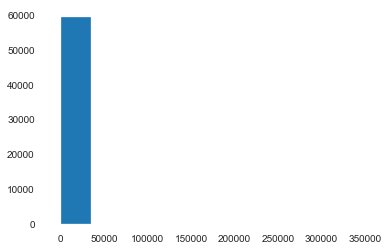

In [18]:
#amount_tsh
plt.hist('amount_tsh',data = pump)

In [19]:
pump['amount_tsh'].skew()

57.8077999458852

In [20]:
# We apply Cube root transformation

pump['amount_tsh'] = np.cbrt(pump['amount_tsh'])



In [21]:
pump['amount_tsh'].skew()

2.7408031117455156

(array([5.1464e+04, 6.4400e+03, 1.2590e+03, 1.8500e+02, 2.7000e+01,
        9.0000e+00, 1.1000e+01, 2.0000e+00, 2.0000e+00, 1.0000e+00]),
 array([ 0.        ,  7.04729873, 14.09459746, 21.1418962 , 28.18919493,
        35.23649366, 42.28379239, 49.33109112, 56.37838986, 63.42568859,
        70.47298732]),
 <a list of 10 Patch objects>)

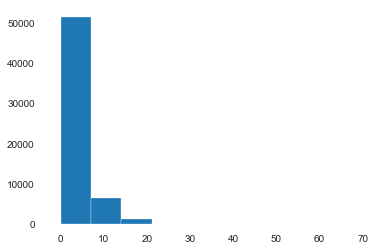

In [22]:

plt.hist('amount_tsh',data = pump)

### High Cardinality Data
We categorise the data to reduce the cardinality. So, anything that isn't among the top values, we place it in a category known as others

In [23]:
# Funder

for x in pump['funder']:
    if (x !='Government Of Tanzania') and (x!='Danida') and (x!='Hesawa') and (x !='Rwssp') and (x !='World Bank'):
        pump['funder'].replace(x,'Others', inplace= True)  

# Installer

for a in pump['installer']:
    if (a !='DWE') and (a!='Government') and (a!='RWE') and (a !='Commu') and (a !='DANIDA'):
        pump['installer'].replace(a,'Others', inplace= True)  

#wpt_name

for b in pump['wpt_name']:
    if (b !='none') and (b!='Shuleni') and (b!='Zahanati') and (b !='Msikitini') and (b !='Kanisani'):
        pump['wpt_name'].replace(b,'Others', inplace= True)  


# Subvillage

for c in pump['subvillage']:
    if ( c!='Madukani') and (c!='Shuleni') and (c!='Majengo') and (c !='Kati') and (c!='Mtakuja'):
        pump['subvillage'].replace(c,'Others', inplace= True)  

#lga

for d in pump['lga']:
    if ( d!='Njombe') and (d!='Arusha Rural') and (d!='Moshi Rural') and (d !='Bariadi') and (d!='Rungwe'):
        pump['lga'].replace(d,'Others', inplace= True)  
        
#ward

for e in pump['ward']:
    if ( e!='Igosi') and (e!='Imalinyi') and (e!='Siha Kati') and (e !='Mdandu') and (e!='Nduruma'):
        pump['ward'].replace(e,'Others', inplace= True)  

#Scheme_name

for f in pump['scheme_name']:
    if ( f!='K') and (f!='None') and (f!='Borehole') and (f !='Chalinze wate') and (f!='Mscheme_name'):
        pump['scheme_name'].replace(f,'Others', inplace= True)  


### Dealing with missing values
There are various missing values in some columns namely funder, installer , permit , public meeting ,scheme management and scheme name.

For funder, installer,Scheme management and Scheme name, we shall impute the missing values with unknown. However, you will see that some missing values in the columns that had high cardinality(funder,installer,scheme_name) have been imputed by being given the value 'Others'.For Permit and Public meeting ( Which are boolean), We shall convert the values to categorical, then inpute missing values with unknown

https://towardsdatascience.com/dealing-with-missing-data-17f8b5827664

https://www.kaggle.com/pavansanagapati/simple-tutorial-how-to-handle-missing-data

https://www.kaggle.com/rtatman/data-cleaning-challenge-handling-missing-values




In [24]:
pump.isnull().sum()

id                      0
amount_tsh              0
date_recorded           0
funder                  0
gps_height              0
installer               0
longitude               0
latitude                0
wpt_name                0
basin                   0
subvillage              0
region                  0
region_code             0
district_code           0
lga                     0
ward                    0
population              0
public_meeting       3334
recorded_by             0
scheme_management    3877
scheme_name             0
permit               3056
construction_year       0
extraction_type         0
management              0
payment                 0
water_quality           0
quantity                0
source                  0
waterpoint_type         0
status_group            0
dtype: int64

In [25]:
# Converting Permit and Public meeting to categorical

pump['permit'] = pump['permit'].astype(str)

pump['public_meeting'] = pump['public_meeting'].astype(str)

In [26]:
# Fill in the missing values

# Permit
pump['permit'].fillna('Unknown', inplace = True)

#Public meeting
pump['public_meeting'].fillna('Unknown', inplace = True)

#Scheme Management

pump['scheme_management'].fillna('Unknown', inplace = True)

In [27]:
pump.isnull().sum()

id                   0
amount_tsh           0
date_recorded        0
funder               0
gps_height           0
installer            0
longitude            0
latitude             0
wpt_name             0
basin                0
subvillage           0
region               0
region_code          0
district_code        0
lga                  0
ward                 0
population           0
public_meeting       0
recorded_by          0
scheme_management    0
scheme_name          0
permit               0
construction_year    0
extraction_type      0
management           0
payment              0
water_quality        0
quantity             0
source               0
waterpoint_type      0
status_group         0
dtype: int64

### Dealing with outliers
https://towardsdatascience.com/ways-to-detect-and-remove-the-outliers-404d16608dba

They can skew our data. Hence let's check for them and handle them

In [28]:
pp.ProfileReport(pump)

## Data Visualization

Let's see the relationship between various variables

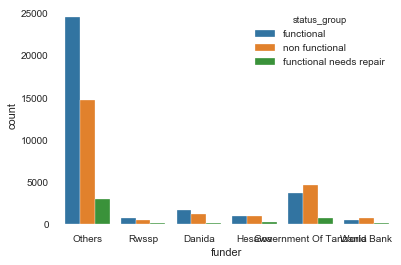

In [29]:
# Funder and Functionality
sns.countplot('funder' , hue = 'status_group', data = pump)

sns.set(rc = {'figure.figsize':(15,15)})


Other funders seem to have more functional pumps. GoT and World bank have more non functional pumps

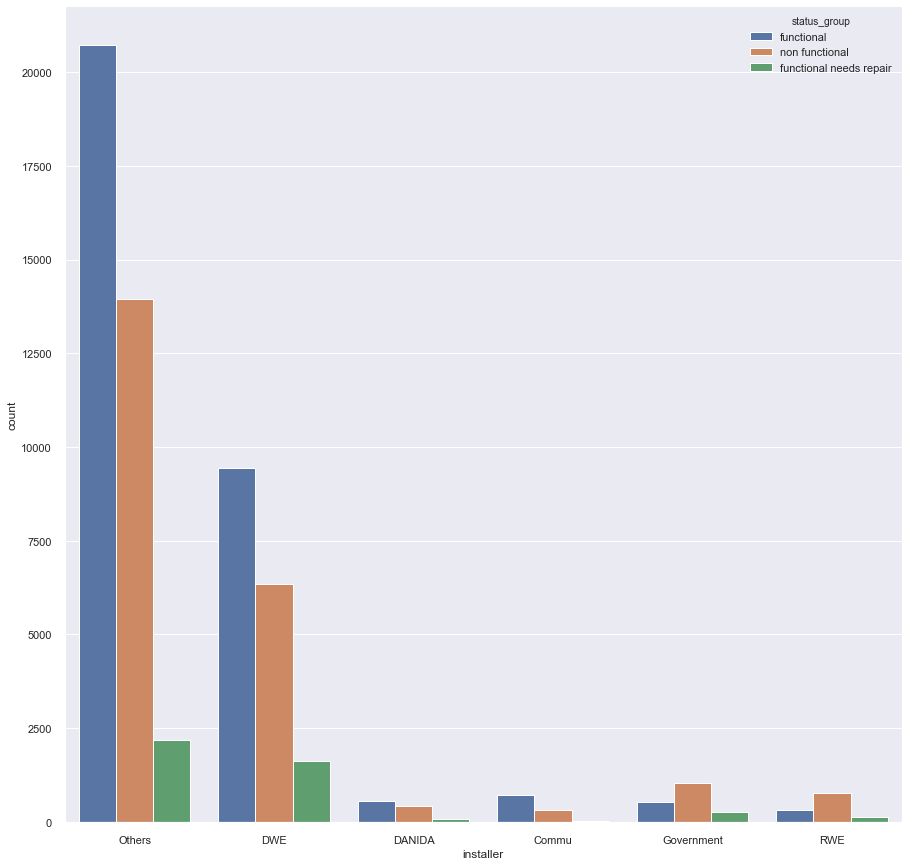

In [30]:
sns.countplot('installer' , hue = 'status_group', data = pump)

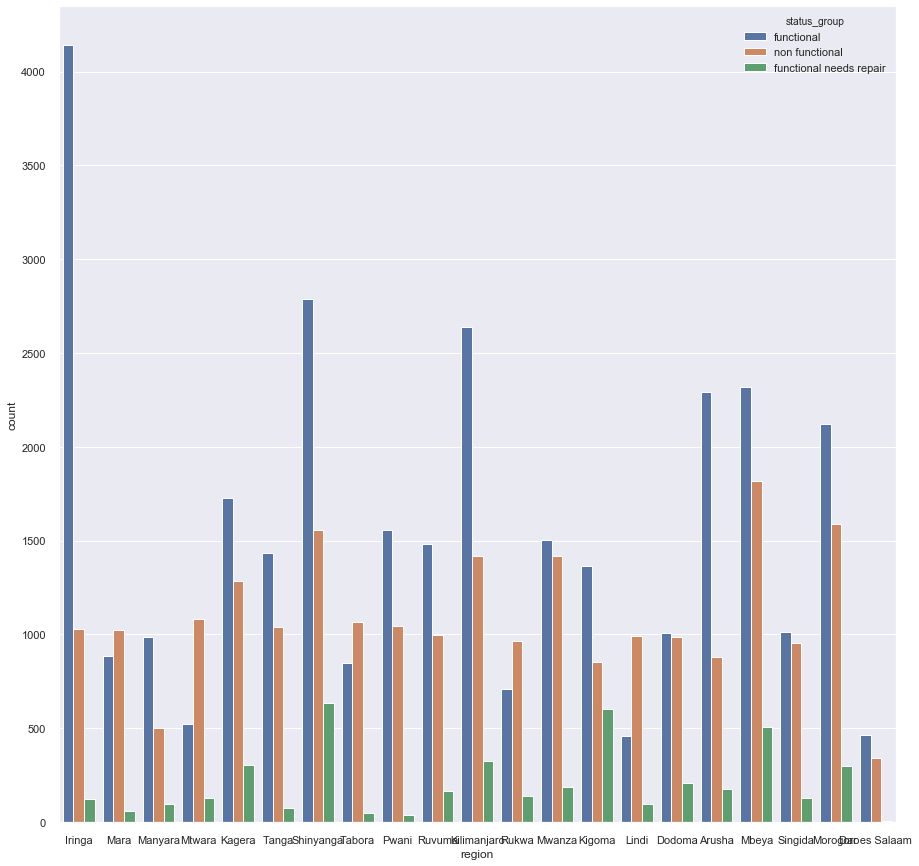

In [31]:
sns.countplot('region' , hue = 'status_group', data = pump)

From the visualizations, we can see that the govt has more less functional pumps. Could be the quality of the pump or negligence in maintenance

## Feature Engineering

In [32]:
pump.sample(20)

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,management,payment,water_quality,quantity,source,waterpoint_type,status_group
45150,25566,5.848035,2011-03-15,Others,501,Others,36.964863,-6.923581e+00,Others,Wami / Ruvu,Others,Morogoro,5,1,Others,Others,1000,True,GeoData Consultants Ltd,VWC,Others,True,1970-01-01 00:00:00.000002008,swn 80,vwc,pay monthly,soft,insufficient,shallow well,hand pump,functional
50383,55469,2.714418,2011-02-27,Others,11,Others,38.507776,-7.864262e+00,Others,Rufiji,Others,Pwani,60,53,Others,Others,1,True,GeoData Consultants Ltd,Private operator,Others,True,1970-01-01 00:00:00.000002011,afridev,private operator,pay per bucket,salty,enough,shallow well,hand pump,functional
32886,33488,0.000000,2011-07-14,Danida,0,Others,33.890468,-9.648381e+00,Others,Lake Nyasa,Others,Mbeya,12,3,Others,Others,0,True,GeoData Consultants Ltd,VWC,Others,True,1970-01-01 00:00:00.000000000,gravity,vwc,never pay,soft,dry,spring,communal standpipe,non functional
49446,13603,0.000000,2013-01-20,Others,1230,Others,30.363623,-5.543306e+00,Others,Lake Tanganyika,Others,Rukwa,15,1,Others,Others,1,True,GeoData Consultants Ltd,Water authority,Others,True,1970-01-01 00:00:00.000001985,other,water authority,never pay,soft,enough,machine dbh,hand pump,non functional
2282,57585,0.000000,2013-01-26,Rwssp,0,DWE,32.507338,-3.941523e+00,Others,Lake Tanganyika,Others,Shinyanga,17,3,Others,Others,0,True,GeoData Consultants Ltd,Unknown,Others,True,1970-01-01 00:00:00.000000000,swn 80,wug,unknown,soft,enough,machine dbh,hand pump,functional
17315,72833,0.000000,2013-02-09,Others,157,Others,38.956908,-8.562929e+00,Others,Ruvuma / Southern Coast,Others,Lindi,80,13,Others,Others,328,True,GeoData Consultants Ltd,Unknown,Others,True,1970-01-01 00:00:00.000001990,nira/tanira,vwc,never pay,salty,enough,shallow well,hand pump,functional
12151,2521,0.000000,2011-08-01,Government Of Tanzania,0,Government,0.000000,-2.000000e-08,Others,Lake Victoria,Others,Mwanza,19,6,Others,Others,0,True,GeoData Consultants Ltd,VWC,Others,True,1970-01-01 00:00:00.000000000,submersible,vwc,unknown,unknown,dry,machine dbh,communal standpipe multiple,non functional
15437,16252,0.000000,2013-02-13,Others,1180,DWE,35.869224,-4.138953e+00,Others,Internal,Others,Manyara,21,1,Others,Others,84,True,GeoData Consultants Ltd,VWC,Others,True,1970-01-01 00:00:00.000001998,gravity,vwc,never pay,soft,enough,spring,communal standpipe,functional
36155,31670,6.299605,2013-01-24,Others,1170,Others,30.248984,-4.628570e+00,Others,Lake Tanganyika,Others,Kigoma,16,2,Others,Others,500,True,GeoData Consultants Ltd,Water authority,Others,True,1970-01-01 00:00:00.000002000,gravity,vwc,pay monthly,soft,enough,river,communal standpipe,functional
14277,10204,0.000000,2013-02-27,Others,618,Others,37.479049,-4.389811e+00,Shuleni,Pangani,Others,Manyara,21,4,Others,Others,300,True,GeoData Consultants Ltd,VWC,Others,True,1970-01-01 00:00:00.000002000,gravity,vwc,never pay,soft,enough,river,other,non functional


In [33]:
pump.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 31 columns):
id                   59400 non-null int64
amount_tsh           59400 non-null float64
date_recorded        59400 non-null datetime64[ns]
funder               59400 non-null object
gps_height           59400 non-null int64
installer            59400 non-null object
longitude            59400 non-null float64
latitude             59400 non-null float64
wpt_name             59400 non-null object
basin                59400 non-null object
subvillage           59400 non-null object
region               59400 non-null object
region_code          59400 non-null int64
district_code        59400 non-null int64
lga                  59400 non-null object
ward                 59400 non-null object
population           59400 non-null int64
public_meeting       59400 non-null object
recorded_by          59400 non-null object
scheme_management    59400 non-null object
scheme_name          5940

In [34]:
pump.columns

Index(['id', 'amount_tsh', 'date_recorded', 'funder', 'gps_height',
       'installer', 'longitude', 'latitude', 'wpt_name', 'basin', 'subvillage',
       'region', 'region_code', 'district_code', 'lga', 'ward', 'population',
       'public_meeting', 'recorded_by', 'scheme_management', 'scheme_name',
       'permit', 'construction_year', 'extraction_type', 'management',
       'payment', 'water_quality', 'quantity', 'source', 'waterpoint_type',
       'status_group'],
      dtype='object')

### Dealing with lat / long features
 Since we have region code and region, I choose to let go of the latitude and longitude column. Howeve, if you want to work with them, review the following article for info on more:
 
 https://medium.com/@khadijamahanga/using-latitude-and-longitude-data-in-my-machine-learning-problem-541e2651e08c
 
 https://towardsdatascience.com/going-dutch-part-2-improving-a-machine-learning-model-using-geographical-data-a8492b67b885
 
 https://datascience.stackexchange.com/questions/23651/can-gps-coordinates-latitude-and-longitude-be-used-as-features-in-a-linear-mod

In [35]:
pump.drop(['longitude','latitude'], axis=1 , inplace = True)

### Convert categorical features to numerical features
Most of our data is nominal and not ordinal, hence we are not limited to what type of encoding we can use.

https://towardsdatascience.com/smarter-ways-to-encode-categorical-data-for-machine-learning-part-1-of-3-6dca2f71b159

http://contrib.scikit-learn.org/categorical-encoding/index.html

https://towardsdatascience.com/all-about-categorical-variable-encoding-305f3361fd02

In [36]:
#Import the library
import category_encoders as ce

In [37]:
for x in pump['status_group']:
    if x =='functional':
        pump['status_group'].replace('functional','Functional', inplace = True)
        
    if x == 'non functional':
        pump['status_group'].replace('non functional','non_functional', inplace = True)
    if x == 'functional needs repair':
        pump['status_group'].replace('functional needs repair','functional_needs_repair', inplace = True)
        

In [38]:
pump['status_group']=pump['status_group'].map({'Functional' : 1,'non_functional':0, 'functional_needs_repair':2})

In [39]:
pump['status_group'].value_counts()

1    32259
0    22824
2     4317
Name: status_group, dtype: int64

In [40]:
#encoder = ce.LeaveOneOutEncoder()

#X = pump.drop('status_group', axis =1)

#y = pump['status_group']


#x_cleaned = encoder.fit_transform(X,y)


from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()

#for column in test:
   # if test[column].dtype=='O':
       # test[column]=encoder.fit_transform(test[column])
        

pump = pump.apply(lambda col: encoder.fit_transform(col.astype(str)), axis=0, result_type='expand')




#cols =['funder','installer', 'wpt_name', 'basin', 'subvillage',
                                       #'region', 'lga', 'ward', 'public_meeting','recorded_by', 'scheme_management',
                                       #'scheme_name', 'permit', 'extraction_type', 'management', 'payment','water_quality', 
                                       #'quantity', 'source', 'waterpoint_type']


In [41]:
pump.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,wpt_name,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,management,payment,water_quality,quantity,source,waterpoint_type,status_group
0,52943,27,47,3,495,4,5,1,4,3,2,10,4,4,38,1,0,8,4,0,40,3,7,2,6,1,8,1,1
1,58321,0,309,3,504,4,4,4,4,9,12,3,4,4,394,2,0,2,4,1,51,3,11,0,6,2,5,1,1
2,21630,38,300,3,2080,4,2,5,2,8,13,8,4,4,341,1,0,8,4,1,50,3,7,4,6,1,0,2,1
3,51290,0,272,3,1611,4,2,7,4,12,25,15,4,4,756,1,0,8,4,1,27,14,7,0,6,0,3,2,0
4,8675,0,104,3,59,4,3,4,4,4,9,1,4,4,0,1,0,7,4,1,0,3,1,0,6,3,5,1,1


### Dimensionality Reduction

https://www.youtube.com/watch?v=ioXKxulmwVQ

https://storage.googleapis.com/kaggle-forum-message-attachments/469411/11253/dimreductiontechniquespydatadcoct2016-170626164019.pdf

Dimensionality reductio is important in that, it helps get rid of unnecessary columns making it easier for the model to generalize. Say we have all the food in the world in an all you can eat buffet. You cannot be able to eat all the food. You just pick the best food that you like and that will fill your stomach 

#### Strategy 1 : Check for Correlation with the Outcome

In [42]:
#pump_it = pd.concat((x_cleaned,y), axis =1)

In [43]:
#pump_it.head()

In [44]:
#pump_it.info()

In [45]:
#x = pump_it.iloc[:,:]
##y = pump_it.iloc[:,28]
#corrmat = pump_it.corr()
#top_features = corrmat.index
#plt.figure(figsize=(20,20))
#matrix =sns.heatmap(pump_it[top_features].corr(),annot=True,cmap="RdYlGn")

Drop the rows that have very low correlation. a correlation less than 0.02. 

In [46]:
pump.drop(['id','recorded_by','wpt_name','population','subvillage'], axis = 1 , inplace = True)

## Model Development

### Deal with imbalanced data

In [47]:
# Split the data

x = pump.drop(['status_group','date_recorded','construction_year'],axis =1)
y= pump['status_group']

In [48]:

# Split into test and train data

x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = 0.3,random_state= 42)

In [49]:
from imblearn.over_sampling import SMOTE

smt = SMOTE()
x_train, y_train = smt.fit_sample(x_train, y_train)



In [50]:
x_test.head()

,amount_tsh,funder,gps_height,installer,basin,region,region_code,district_code,lga,ward,public_meeting,scheme_management,scheme_name,permit,extraction_type,management,payment,water_quality,quantity,source,waterpoint_type
2980,0,3,59,2,3,17,8,10,4,4,1,10,4,1,9,11,6,6,0,7,6
5246,0,3,59,4,3,19,5,12,4,4,1,8,4,1,4,7,0,3,2,7,4
22659,34,3,811,2,0,8,13,1,4,4,1,11,4,1,3,9,4,6,2,8,1
39888,0,3,59,4,2,10,3,12,4,4,0,8,4,0,8,7,0,6,3,7,4
13361,59,3,183,4,0,18,4,1,4,4,1,9,4,1,7,10,4,6,1,3,2


              precision    recall  f1-score   support

           0       0.75      0.74      0.75      6803
           1       0.80      0.74      0.77      9724
           2       0.29      0.46      0.36      1293

    accuracy                           0.72     17820
   macro avg       0.61      0.65      0.62     17820
weighted avg       0.74      0.72      0.73     17820



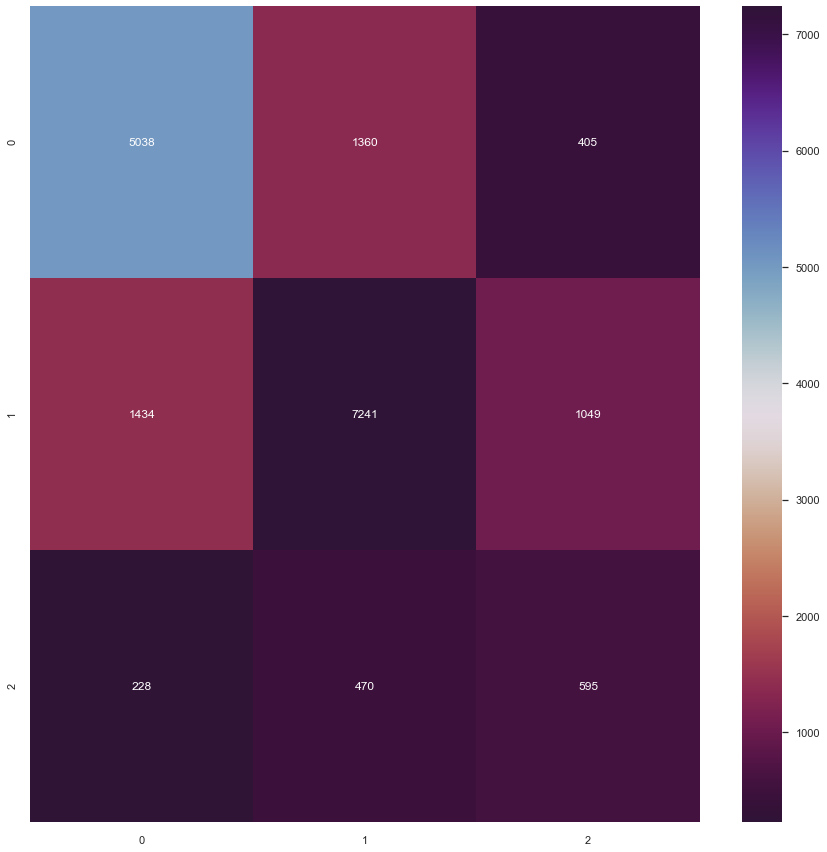

In [51]:
# Decision Tree

#Call the model
dt = DecisionTreeClassifier()

#Train the model
dt.fit(x_train,y_train)

#Predict values
dt_pred = dt.predict(x_test)

#classification report

print(classification_report(y_test,dt_pred))

#confusion matrix

dt_cm = confusion_matrix(y_test,dt_pred)

sns.heatmap(dt_cm, annot = True, fmt= 'd' , cmap = 'twilight_shifted_r')

              precision    recall  f1-score   support

           0       0.79      0.76      0.77      6803
           1       0.81      0.78      0.80      9724
           2       0.33      0.50      0.39      1293

    accuracy                           0.75     17820
   macro avg       0.64      0.68      0.66     17820
weighted avg       0.77      0.75      0.76     17820



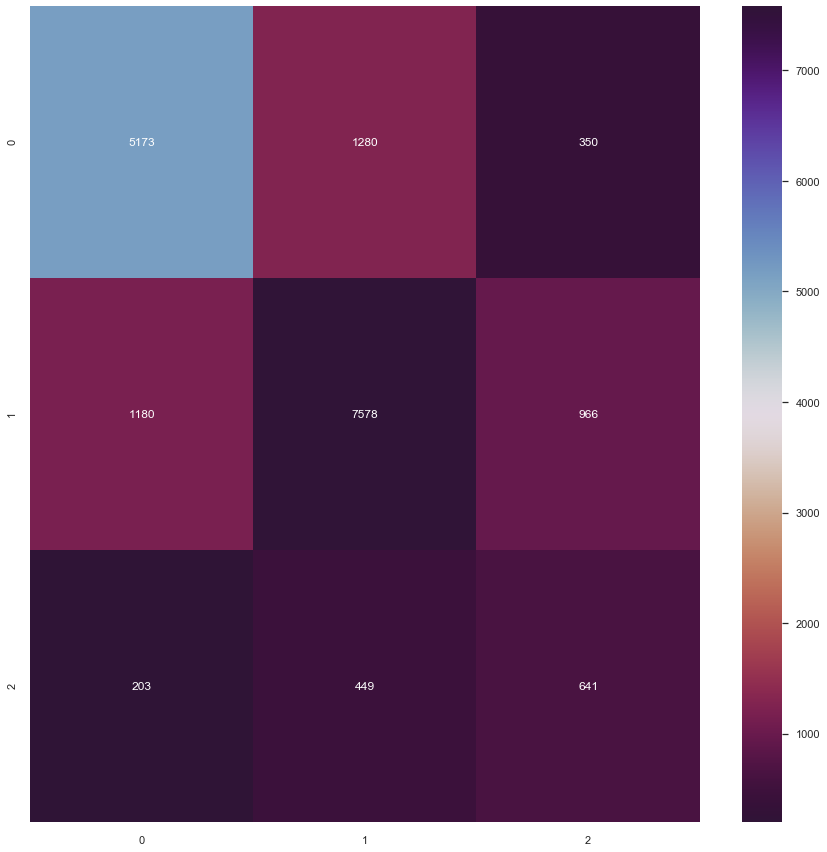

In [52]:

#random Forest

rf = RandomForestClassifier(n_estimators = 250)

#Fit
rf.fit(x_train,y_train)

#Predict
rf_pred = rf.predict(x_test)

#classification report

print(classification_report(y_test,rf_pred))

#confusion matrix
rf_cm = confusion_matrix(y_test,rf_pred)

sns.heatmap(rf_cm, annot = True, fmt= 'd' , cmap = 'twilight_shifted_r')


0:	learn: 1.0873331	total: 144ms	remaining: 2m 24s
1:	learn: 1.0768052	total: 190ms	remaining: 1m 34s
2:	learn: 1.0669676	total: 222ms	remaining: 1m 13s
3:	learn: 1.0572678	total: 256ms	remaining: 1m 3s
4:	learn: 1.0481774	total: 295ms	remaining: 58.7s
5:	learn: 1.0402058	total: 327ms	remaining: 54.1s
6:	learn: 1.0322995	total: 358ms	remaining: 50.8s
7:	learn: 1.0248834	total: 390ms	remaining: 48.4s
8:	learn: 1.0175945	total: 421ms	remaining: 46.4s
9:	learn: 1.0110969	total: 453ms	remaining: 44.8s
10:	learn: 1.0037496	total: 484ms	remaining: 43.5s
11:	learn: 0.9977263	total: 515ms	remaining: 42.4s
12:	learn: 0.9915556	total: 546ms	remaining: 41.4s
13:	learn: 0.9859322	total: 577ms	remaining: 40.6s
14:	learn: 0.9804336	total: 608ms	remaining: 39.9s
15:	learn: 0.9751064	total: 639ms	remaining: 39.3s
16:	learn: 0.9702264	total: 671ms	remaining: 38.8s
17:	learn: 0.9646677	total: 704ms	remaining: 38.4s
18:	learn: 0.9601305	total: 735ms	remaining: 38s
19:	learn: 0.9549447	total: 766ms	remain

166:	learn: 0.7374223	total: 5.49s	remaining: 27.4s
167:	learn: 0.7370120	total: 5.51s	remaining: 27.3s
168:	learn: 0.7364647	total: 5.54s	remaining: 27.3s
169:	learn: 0.7357994	total: 5.57s	remaining: 27.2s
170:	learn: 0.7351868	total: 5.6s	remaining: 27.2s
171:	learn: 0.7346008	total: 5.63s	remaining: 27.1s
172:	learn: 0.7339213	total: 5.66s	remaining: 27.1s
173:	learn: 0.7332231	total: 5.69s	remaining: 27s
174:	learn: 0.7326294	total: 5.73s	remaining: 27s
175:	learn: 0.7320527	total: 5.76s	remaining: 27s
176:	learn: 0.7313862	total: 5.79s	remaining: 26.9s
177:	learn: 0.7309892	total: 5.82s	remaining: 26.9s
178:	learn: 0.7306091	total: 5.85s	remaining: 26.8s
179:	learn: 0.7298632	total: 5.88s	remaining: 26.8s
180:	learn: 0.7292599	total: 5.91s	remaining: 26.8s
181:	learn: 0.7288072	total: 5.95s	remaining: 26.7s
182:	learn: 0.7283254	total: 5.98s	remaining: 26.7s
183:	learn: 0.7278776	total: 6.01s	remaining: 26.6s
184:	learn: 0.7273690	total: 6.04s	remaining: 26.6s
185:	learn: 0.72665

327:	learn: 0.6698304	total: 10.5s	remaining: 21.6s
328:	learn: 0.6694041	total: 10.6s	remaining: 21.6s
329:	learn: 0.6690907	total: 10.6s	remaining: 21.5s
330:	learn: 0.6687523	total: 10.6s	remaining: 21.5s
331:	learn: 0.6684393	total: 10.7s	remaining: 21.5s
332:	learn: 0.6681544	total: 10.7s	remaining: 21.4s
333:	learn: 0.6677120	total: 10.7s	remaining: 21.4s
334:	learn: 0.6673992	total: 10.8s	remaining: 21.4s
335:	learn: 0.6669086	total: 10.8s	remaining: 21.3s
336:	learn: 0.6665326	total: 10.8s	remaining: 21.3s
337:	learn: 0.6662275	total: 10.9s	remaining: 21.3s
338:	learn: 0.6658514	total: 10.9s	remaining: 21.2s
339:	learn: 0.6655359	total: 10.9s	remaining: 21.2s
340:	learn: 0.6651869	total: 10.9s	remaining: 21.1s
341:	learn: 0.6648631	total: 11s	remaining: 21.1s
342:	learn: 0.6646268	total: 11s	remaining: 21.1s
343:	learn: 0.6643163	total: 11.1s	remaining: 21.1s
344:	learn: 0.6639294	total: 11.1s	remaining: 21s
345:	learn: 0.6636576	total: 11.1s	remaining: 21s
346:	learn: 0.663405

488:	learn: 0.6251909	total: 15.7s	remaining: 16.4s
489:	learn: 0.6249838	total: 15.7s	remaining: 16.4s
490:	learn: 0.6248247	total: 15.8s	remaining: 16.3s
491:	learn: 0.6246802	total: 15.8s	remaining: 16.3s
492:	learn: 0.6244667	total: 15.8s	remaining: 16.3s
493:	learn: 0.6242069	total: 15.9s	remaining: 16.2s
494:	learn: 0.6239443	total: 15.9s	remaining: 16.2s
495:	learn: 0.6237069	total: 15.9s	remaining: 16.2s
496:	learn: 0.6235660	total: 15.9s	remaining: 16.1s
497:	learn: 0.6233582	total: 16s	remaining: 16.1s
498:	learn: 0.6231253	total: 16s	remaining: 16.1s
499:	learn: 0.6229202	total: 16s	remaining: 16s
500:	learn: 0.6227962	total: 16.1s	remaining: 16s
501:	learn: 0.6225516	total: 16.1s	remaining: 16s
502:	learn: 0.6223663	total: 16.1s	remaining: 15.9s
503:	learn: 0.6221414	total: 16.1s	remaining: 15.9s
504:	learn: 0.6219716	total: 16.2s	remaining: 15.9s
505:	learn: 0.6217448	total: 16.2s	remaining: 15.8s
506:	learn: 0.6215470	total: 16.2s	remaining: 15.8s
507:	learn: 0.6213224	to

648:	learn: 0.5959248	total: 21s	remaining: 11.4s
649:	learn: 0.5957190	total: 21.1s	remaining: 11.3s
650:	learn: 0.5955990	total: 21.1s	remaining: 11.3s
651:	learn: 0.5954661	total: 21.1s	remaining: 11.3s
652:	learn: 0.5952918	total: 21.2s	remaining: 11.2s
653:	learn: 0.5951842	total: 21.2s	remaining: 11.2s
654:	learn: 0.5950257	total: 21.2s	remaining: 11.2s
655:	learn: 0.5949096	total: 21.3s	remaining: 11.2s
656:	learn: 0.5947518	total: 21.3s	remaining: 11.1s
657:	learn: 0.5946414	total: 21.3s	remaining: 11.1s
658:	learn: 0.5944660	total: 21.4s	remaining: 11.1s
659:	learn: 0.5942899	total: 21.4s	remaining: 11s
660:	learn: 0.5941633	total: 21.4s	remaining: 11s
661:	learn: 0.5940405	total: 21.5s	remaining: 11s
662:	learn: 0.5938450	total: 21.5s	remaining: 10.9s
663:	learn: 0.5937445	total: 21.5s	remaining: 10.9s
664:	learn: 0.5936106	total: 21.6s	remaining: 10.9s
665:	learn: 0.5934589	total: 21.6s	remaining: 10.8s
666:	learn: 0.5932627	total: 21.6s	remaining: 10.8s
667:	learn: 0.593108

811:	learn: 0.5736684	total: 26.2s	remaining: 6.06s
812:	learn: 0.5735796	total: 26.2s	remaining: 6.03s
813:	learn: 0.5734819	total: 26.2s	remaining: 6s
814:	learn: 0.5733681	total: 26.3s	remaining: 5.96s
815:	learn: 0.5732259	total: 26.3s	remaining: 5.93s
816:	learn: 0.5731044	total: 26.3s	remaining: 5.9s
817:	learn: 0.5729633	total: 26.4s	remaining: 5.87s
818:	learn: 0.5727789	total: 26.4s	remaining: 5.83s
819:	learn: 0.5726570	total: 26.4s	remaining: 5.8s
820:	learn: 0.5725378	total: 26.5s	remaining: 5.77s
821:	learn: 0.5724132	total: 26.5s	remaining: 5.74s
822:	learn: 0.5723242	total: 26.5s	remaining: 5.71s
823:	learn: 0.5721772	total: 26.6s	remaining: 5.68s
824:	learn: 0.5720058	total: 26.6s	remaining: 5.64s
825:	learn: 0.5719194	total: 26.6s	remaining: 5.61s
826:	learn: 0.5718565	total: 26.7s	remaining: 5.58s
827:	learn: 0.5716768	total: 26.7s	remaining: 5.55s
828:	learn: 0.5715967	total: 26.7s	remaining: 5.51s
829:	learn: 0.5715094	total: 26.8s	remaining: 5.48s
830:	learn: 0.571

973:	learn: 0.5560990	total: 31.3s	remaining: 836ms
974:	learn: 0.5560400	total: 31.4s	remaining: 804ms
975:	learn: 0.5559647	total: 31.4s	remaining: 772ms
976:	learn: 0.5558908	total: 31.4s	remaining: 739ms
977:	learn: 0.5557921	total: 31.4s	remaining: 707ms
978:	learn: 0.5557257	total: 31.5s	remaining: 675ms
979:	learn: 0.5556398	total: 31.5s	remaining: 643ms
980:	learn: 0.5555610	total: 31.5s	remaining: 611ms
981:	learn: 0.5554358	total: 31.6s	remaining: 579ms
982:	learn: 0.5553538	total: 31.6s	remaining: 546ms
983:	learn: 0.5552299	total: 31.6s	remaining: 514ms
984:	learn: 0.5551110	total: 31.7s	remaining: 482ms
985:	learn: 0.5550275	total: 31.7s	remaining: 450ms
986:	learn: 0.5549503	total: 31.7s	remaining: 418ms
987:	learn: 0.5548681	total: 31.7s	remaining: 386ms
988:	learn: 0.5548032	total: 31.8s	remaining: 353ms
989:	learn: 0.5547494	total: 31.8s	remaining: 321ms
990:	learn: 0.5546813	total: 31.8s	remaining: 289ms
991:	learn: 0.5545407	total: 31.9s	remaining: 257ms
992:	learn: 

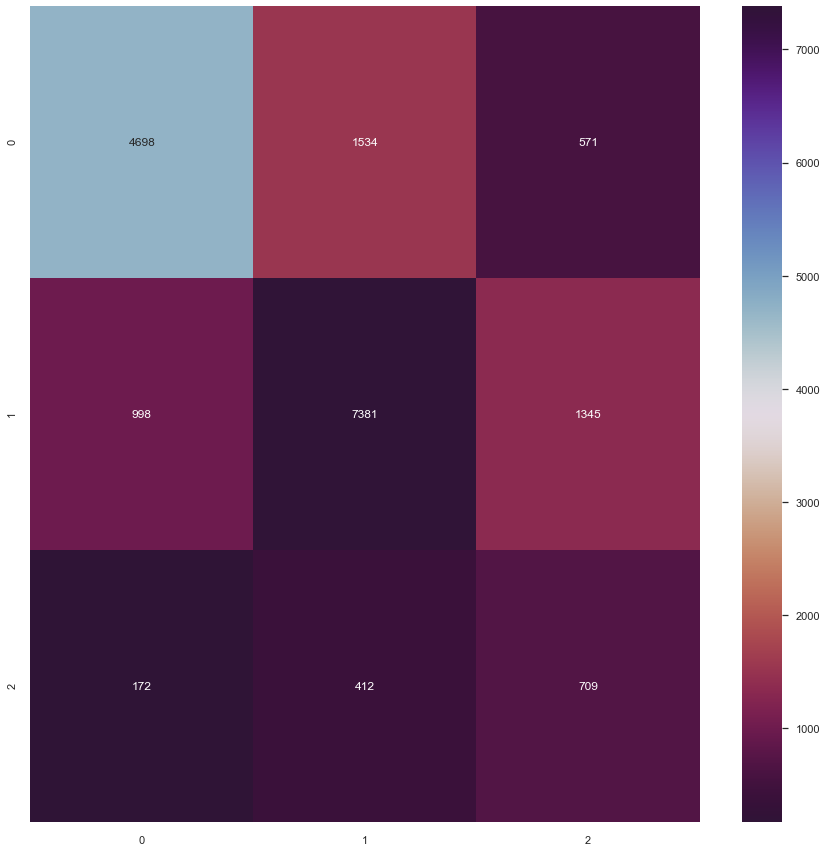

In [53]:
# catBoost
cat = CatBoostClassifier()

# Train model
cat.fit(x_train,y_train)

#Predict
y_pred_cat = cat.predict(x_test)

#Classification report
print(classification_report(y_test,y_pred_cat))

#confusion matrix
cat_cm = confusion_matrix(y_test,y_pred_cat)

sns.heatmap(cat_cm, annot = True, fmt= 'd' , cmap = 'twilight_shifted_r')

# Test data


In [54]:
test = pd.read_csv('Test Set Values.csv', parse_dates = ['date_recorded','construction_year'])

In [55]:
test.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,50785,0.0,2013-02-04,Dmdd,1996,DMDD,35.290799,-4.059696,Dinamu Secondary School,0,Internal,Magoma,Manyara,21,3,Mbulu,Bashay,321,True,GeoData Consultants Ltd,Parastatal,NaN,True,2012,other,other,other,parastatal,parastatal,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,other,other
1,51630,0.0,2013-02-04,Government Of Tanzania,1569,DWE,36.656709,-3.309214,Kimnyak,0,Pangani,Kimnyak,Arusha,2,2,Arusha Rural,Kimnyaki,300,True,GeoData Consultants Ltd,VWC,TPRI pipe line,True,2000,gravity,gravity,gravity,vwc,user-group,never pay,never pay,soft,good,insufficient,insufficient,spring,spring,groundwater,communal standpipe,communal standpipe
2,17168,0.0,2013-02-01,NaN,1567,NaN,34.767863,-5.004344,Puma Secondary,0,Internal,Msatu,Singida,13,2,Singida Rural,Puma,500,True,GeoData Consultants Ltd,VWC,P,NaN,2010,other,other,other,vwc,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,other,other
3,45559,0.0,2013-01-22,Finn Water,267,FINN WATER,38.058046,-9.418672,Kwa Mzee Pange,0,Ruvuma / Southern Coast,Kipindimbi,Lindi,80,43,Liwale,Mkutano,250,NaN,GeoData Consultants Ltd,VWC,NaN,True,1987,other,other,other,vwc,user-group,unknown,unknown,soft,good,dry,dry,shallow well,shallow well,groundwater,other,other
4,49871,500.0,2013-03-27,Bruder,1260,BRUDER,35.006123,-10.950412,Kwa Mzee Turuka,0,Ruvuma / Southern Coast,Losonga,Ruvuma,10,3,Mbinga,Mbinga Urban,60,NaN,GeoData Consultants Ltd,Water Board,BRUDER,True,2000,gravity,gravity,gravity,water board,user-group,pay monthly,monthly,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe


In [56]:
test.drop(['extraction_type_group', 'extraction_type_class',
           'management_group','payment_type',
           'quality_group','quantity_group',
           'source_type', 'source_class',
           'waterpoint_type_group','num_private',
           'date_recorded','construction_year','longitude','latitude',
          'id','recorded_by','wpt_name','population','subvillage'], axis = 1, inplace=True)

In [57]:
test['amount_tsh'] = np.cbrt(test['amount_tsh'])

In [58]:
# Funder

for x in test['funder']:
    if (x !='Government Of Tanzania') and (x!='Danida') and (x!='Hesawa') and (x !='Rwssp') and (x !='World Bank'):
        test['funder'].replace(x,'Others', inplace= True)  

# Installer

for a in test['installer']:
    if (a !='DWE') and (a!='Government') and (a!='RWE') and (a !='Commu') and (a !='DANIDA'):
        test['installer'].replace(a,'Others', inplace= True)  



#lga

for d in test['lga']:
    if ( d!='Njombe') and (d!='Arusha Rural') and (d!='Moshi Rural') and (d !='Bariadi') and (d!='Rungwe'):
        test['lga'].replace(d,'Others', inplace= True)  
        
#ward

for e in test['ward']:
    if ( e!='Igosi') and (e!='Imalinyi') and (e!='Siha Kati') and (e !='Mdandu') and (e!='Nduruma'):
        test['ward'].replace(e,'Others', inplace= True)  

#Scheme_name

for f in test['scheme_name']:
    if ( f!='K') and (f!='None') and (f!='Borehole') and (f !='Chalinze wate') and (f!='Mscheme_name'):
        test['scheme_name'].replace(f,'Others', inplace= True) 

In [59]:
# Fill in the missing values

# Permit
test['permit'].fillna('Unknown', inplace = True)

#Public meetingtest
test['public_meeting'].fillna('Unknown', inplace = True)

#Scheme Management

test['scheme_management'].fillna('Unknown', inplace = True)

In [60]:
test.head()

,amount_tsh,funder,gps_height,installer,basin,region,region_code,district_code,lga,ward,public_meeting,scheme_management,scheme_name,permit,extraction_type,management,payment,water_quality,quantity,source,waterpoint_type
0,0.000000,Others,1996,Others,Internal,Manyara,21,3,Others,Others,True,Parastatal,Others,True,other,parastatal,never pay,soft,seasonal,rainwater harvesting,other
1,0.000000,Government Of Tanzania,1569,DWE,Pangani,Arusha,2,2,Arusha Rural,Others,True,VWC,Others,True,gravity,vwc,never pay,soft,insufficient,spring,communal standpipe
2,0.000000,Others,1567,Others,Internal,Singida,13,2,Others,Others,True,VWC,Others,Unknown,other,vwc,never pay,soft,insufficient,rainwater harvesting,other
3,0.000000,Others,267,Others,Ruvuma / Southern Coast,Lindi,80,43,Others,Others,Unknown,VWC,Others,True,other,vwc,unknown,soft,dry,shallow well,other
4,7.937005,Others,1260,Others,Ruvuma / Southern Coast,Ruvuma,10,3,Others,Others,Unknown,Water Board,Others,True,gravity,water board,pay monthly,soft,enough,spring,communal standpipe


In [61]:
test.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14850 entries, 0 to 14849
Data columns (total 21 columns):
amount_tsh           14850 non-null float64
funder               14850 non-null object
gps_height           14850 non-null int64
installer            14850 non-null object
basin                14850 non-null object
region               14850 non-null object
region_code          14850 non-null int64
district_code        14850 non-null int64
lga                  14850 non-null object
ward                 14850 non-null object
public_meeting       14850 non-null object
scheme_management    14850 non-null object
scheme_name          14850 non-null object
permit               14850 non-null object
extraction_type      14850 non-null object
management           14850 non-null object
payment              14850 non-null object
water_quality        14850 non-null object
quantity             14850 non-null object
source               14850 non-null object
waterpoint_type      14850 non-nu

In [62]:
test['source'].dtype

dtype('O')

In [63]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()

#for column in test:
   # if test[column].dtype=='O':
       # test[column]=encoder.fit_transform(test[column])
        

test = test.apply(lambda col: encoder.fit_transform(col.astype(str)), axis=0, result_type='expand')





In [64]:
test.head()

,amount_tsh,funder,gps_height,installer,basin,region,region_code,district_code,lga,ward,public_meeting,scheme_management,scheme_name,permit,extraction_type,management,payment,water_quality,quantity,source,waterpoint_type
0,0,3,1130,4,0,8,13,5,4,4,1,2,4,1,9,3,0,6,3,5,6
1,0,1,682,2,5,0,11,3,0,4,1,7,4,1,3,7,0,6,2,8,1
2,0,3,680,4,0,18,4,3,4,4,1,7,4,2,9,7,0,6,2,5,6
3,0,3,1393,4,7,7,22,9,4,4,2,7,4,1,9,7,6,6,0,7,6
4,63,3,342,4,7,16,1,5,4,4,2,10,4,1,3,9,3,6,1,8,1


In [65]:
y_pred_cat = cat.predict(test)

In [66]:
y_pred_cat = y_pred_cat.astype(int)

In [67]:
type(y_pred_cat)

numpy.ndarray

In [68]:
y_pred=pd.DataFrame(y_pred_cat)

In [69]:
y_pred

,0
0,0
1,1
2,0
3,0
4,1
...,...
14845,0
14846,1
14847,2
14848,1


In [70]:
y_pred[0]=y_pred[0].map({1 :'functional',0:'non functional', 2:'functional needs repair'})

In [71]:
submission = pd.read_csv('SubmissionFormat.csv')

In [72]:
submission.head()

,id,status_group
0,50785,predicted label
1,51630,predicted label
2,17168,predicted label
3,45559,predicted label
4,49871,predicted label


In [73]:
submission['status_group']=y_pred[0]

In [74]:
submission.to_csv('Finished.csv',index=False)